In [1]:
import pandas as pd
import re

In [2]:
import networkx as nx

In [3]:
G = nx.MultiDiGraph()

In [4]:
file_path = 'Liguori_translations_FR_normalized_publishers_translators_places.xlsx'
df = pd.read_excel(file_path)

In [93]:
df

,First ed.,Subsq. ed.,Editions,Ed. #,Digital file,Unnamed: 4,Author,Title,Unnamed: 7,Publisher,...,End matter,Images,Notes,Full title,Source lg,Original title,Original pub place,Original year,Normalized Publisher,Normalized Translator
0,1804.0,1894,2,2nd ed.,NaN,NaN,Alphonse de Liguori (1696-1787 ; saint),Abrégé de la théologie morale de S. Alphonse d...,NaN,Duculot-Roulin,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,duculotroulin,"frassinetti, g"
1,1832.0,1834,3,3rd (1834),https://www.google.se/books/edition/Amour_des_...,NaN,Alphonse de Liguori (1696-1787 ; saint),"Amour des Âmes, ou Réflections (""sic"") et affe...",NaN,Vial; Béthune; Sauvignet et Honorat,...,none,yes,NaN,NaN,NaN,NaN,NaN,NaN,vial; bthune; sauvignet,NaN
2,1835.0,NaN,1,NaN,https://www.google.se/books/edition/Horloge_de...,NaN,Alphonse de Liguori (1696-1787 ; saint),"Amour des Âmes, ou Réflections (""sic"") et affe...",NaN,F. Guyot,...,none,none,NaN,NaN,Italian,NaN,NaN,NaN,guyot,NaN
3,1835.0,NaN,1,NaN,NaN,NaN,Alphonse de Liguori (1696-1787 ; saint),"Amour des Âmes, ou Réflections (""sic"") et affe...",NaN,J. Mossy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mossy,NaN
4,1865.0,1868,2,NaN,NaN,NaN,Alphonse de Liguori (1696-1787 ; saint),"Amour des Âmes, ou Réflections (""sic"") et affe...",NaN,R. Ruffet,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ruffet,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,1867.0,NaN,1,NaN,NaN,NaN,L.C. Bourquard & saint Alphonse de Liguori,Le livre des missions : recueil d'instructions...,NaN,Benziger,...,NaN,NaN,NaN,Le livre des missions : recueil d'instructions...,NaN,NaN,NaN,NaN,benziger,NaN
643,1882.0,NaN,2,2 editions at least,NaN,NaN,"Liguori, Alphonsus Maria de (1696-1787) - sanc...",Gloires de Marie,NaN,SaintPaul,...,NaN,NaN,Trad. nouv,Les gloires de Marie,NaN,NaN,NaN,NaN,saintpaul,"pladys, e"
644,1883.0,NaN,1,NaN,NaN,NaN,"Liguori, Alphonsus Maria de (1696-1787) - sanc...",Le Rosaire expliqué par Saint Alphone de L. Ex...,NaN,SaintPaul,...,NaN,NaN,NaN,Le Rosaire expliqué par Saint Alphone de L. Ex...,NaN,NaN,NaN,NaN,saintpaul,NaN
645,1840.0,NaN,1,NaN,NaN,NaN,NaN,La vie de Saint-Alphonse-Marie de Liguori,NaN,NaN,...,NaN,NaN,NaN,La vie de Saint-Alphonse-Marie de Liguori,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:

unique_publishers = set()


for publisher_entry in df['Normalized Publisher']:
    if pd.notna(publisher_entry):  # Ignore NaN values
        # Split by semicolon, clean spaces, and add each publisher separately
        publishers = [pub.strip() for pub in str(publisher_entry).split(';') if pub.strip()]
        unique_publishers.update(publishers)

# Step 2: Define each unique publisher as a node in the graph
for publisher in unique_publishers:
    G.add_node(publisher, publications=[])


In [6]:
unique_publishers

{'abadie',
 'adam',
 'aimburdet',
 'alzine',
 'ardant',
 'ardent',
 'association catholique du sacré-coeur',
 'aubanel',
 'aumont',
 'aux bureaux de la sainte famille',
 'barbou',
 'barets',
 'barret',
 'beauchesne',
 'beauchne',
 'beaucrusand',
 'begyn',
 'belin',
 'bellegarrigue',
 'bellet',
 'belon',
 'benziger',
 'berquier',
 'bgat',
 'biarns',
 'bibliothque populaire',
 'bitsch',
 'boget',
 'boissel',
 'boiste',
 'bouquerel',
 'bourguetcalas',
 'bousquetoffray',
 'bray',
 'bricon',
 'briez',
 'briguet',
 'bthune',
 'bureau de la des livres de piété',
 'bureau de labeille',
 'bureau des mlanges religieux',
 'busseuil',
 'carez',
 'caron',
 'casterman',
 'cattier',
 'chaillot',
 'chambeau',
 'chaul',
 'clermont',
 'clermont librairie catholique',
 'cornillac',
 'couanon',
 'couch',
 'crozet',
 'curnier',
 'darnaultmaurant',
 'de brouwer',
 'de lamarzelle',
 'decallonneliagre',
 'dechrist',
 'deckherr',
 'degouy',
 'dehansy',
 'delahaut',
 'delalain',
 'delhomme',
 'deligne',
 'delso

In [7]:


for specific_publisher in G.nodes():
    # Use zip to iterate over each row in the DataFrame, referencing specific columns
    for title, first_ed, subsq_ed, edition, publisher, translator, place in zip(
        df['Title'],
        df['First ed.'],
        df['Subsq. ed.'],
        df['Editions'],
        df['Normalized Publisher'],
        df['Normalized Translator'],
        df['Publ. place']
    ):
        
        # publisher = str(publisher) if not pd.isna(publisher) else ""
        publisher_list = [pub.strip() for pub in str(publisher).split(';') if pub.strip()]
        translator_list = [trans.strip() for trans in str(translator).split(';') if trans.strip()]
        place_list = [pl.strip() for pl in str(place).split(';') if pl.strip()]
        
        if specific_publisher in publisher_list:
            G.nodes[specific_publisher]['publications'].append({
                'title': title,
                'years': [first_ed, subsq_ed],  # List of years from 'First ed.' and 'Subsq. ed'
                'editions': [edition],
                'publisher': publisher_list,
                'translator': translator_list,
                'place': place_list
            })

In [8]:

for publisher in G.nodes():
    if 'publications' in G.nodes[publisher]:  # Check if 'publications' key exists
        magnitude = sum(pub['editions'][0] for pub in G.nodes[publisher]['publications'])
        G.nodes[publisher]['magnitude'] = magnitude

In [10]:

nodes_with_sizes = [(publisher, data['magnitude']) for publisher, data in G.nodes(data=True) if 'magnitude' in data]

sorted_nodes = sorted(nodes_with_sizes, key=lambda x: x[1], reverse=True)

for publisher, size in sorted_nodes:
    print(f"Publisher: {publisher}, Size: {size}")

Publisher: casterman, Size: 320
Publisher: mame, Size: 135
Publisher: librairie internationale catholique, Size: 121
Publisher: perisse, Size: 113
Publisher: rittler, Size: 105
Publisher: barbou, Size: 97
Publisher: ardant, Size: 94
Publisher: thibaud, Size: 52
Publisher: lefort, Size: 52
Publisher: plagaud, Size: 51
Publisher: landriot, Size: 41
Publisher: aux bureaux de la sainte famille, Size: 35
Publisher: parent-desbarres, Size: 32
Publisher: bureau de la des livres de piété, Size: 30
Publisher: kittler, Size: 27
Publisher: gaume, Size: 26
Publisher: rusand, Size: 22
Publisher: librairie catholique, Size: 20
Publisher: sguin, Size: 20
Publisher: desclee, Size: 17
Publisher: maison des pères rédemptoristes, Size: 16
Publisher: ruffet, Size: 14
Publisher: gallienne, Size: 14
Publisher: lecoffre, Size: 14
Publisher: laroche, Size: 12
Publisher: saintaugustin, Size: 12
Publisher: lesne, Size: 11
Publisher: cornillac, Size: 10
Publisher: marietti, Size: 10
Publisher: pellion, Size: 10


In [11]:
len(G.nodes())

234

In [10]:

def add_edge_with_attributes(G, publisher_A, publisher_B, title, source_years, target_years,
                             source_translator, target_translator, source_num_editions,
                             target_num_editions, source_place, target_place, weight, relation, key):
    G.add_edge(publisher_A, publisher_B, title=title, source_years=source_years, target_years=target_years,
               source_translator=source_translator, target_translator=target_translator,
               source_num_editions=source_num_editions, target_num_editions=target_num_editions,
               source_place=source_place, target_place=target_place, weight=weight, relation=relation, key=key)

In [9]:
import itertools

In [14]:
existing_edges = set()

In [11]:
# import itertools

# Function to add edges between publishers with support for multiple edges of the same type
def add_edges_between_publishers(G):
    for pub_A, pub_B in itertools.combinations(G.nodes, 2):  # Iterate over pairs of nodes
        publications_A = G.nodes[pub_A]['publications']
        publications_B = G.nodes[pub_B]['publications']
        
        # Compare all publications between two publishers
        for publication_A in publications_A:
            for publication_B in publications_B:
                title_A, title_B = publication_A['title'], publication_B['title']
                years_A, years_B = publication_A['years'], publication_B['years']
                editions_A, editions_B = publication_A['editions'], publication_B['editions']
                translators_A, translators_B = publication_A['translator'], publication_B['translator']
                publishers_A, publishers_B = set(publication_A['publisher']), set(publication_B['publisher'])
                
                # Initialize edge counters
                edge_counter = 0

                # Check for copublication
                if (len(publishers_A) == 1 & len(publishers_B) == 1) and title_A == title_B and set(years_A) == set(years_B):
                    # Create a unique edge key
                    edge_counter = sum(1 for key in existing_edges if f"copub_{pub_A}_{pub_B}_" in key) + 1
                    edge_key = f"copub_{pub_A}_{pub_B}_{title_A}_{edge_counter}"

                    # Check if the edge already exists
                    if edge_key not in existing_edges:
                        weight = max(editions_A[0], editions_B[0])
                        add_edge_with_attributes(
                            G, pub_A, pub_B, title_A, years_A, years_B, translators_A, translators_B,
                            editions_A, editions_B, publication_A['place'], publication_B['place'],
                            weight, 'copublication', edge_key
                        )
                        existing_edges.add(edge_key)

                # Check for reprint relation
                if set(translators_A) == set(translators_B) and title_A == title_B and years_A and years_B:
                    if len(years_A) > 0 and len(years_B) > 0:
                        if years_A[0] < years_B[0] and publishers_A != publishers_B:
                            edge_counter += 1
                            edge_key = f"reprint_{pub_A}_{pub_B}_{title_A}_{edge_counter}"

                            # Check if the edge already exists
                            if edge_key not in existing_edges:
                                weight = editions_B[0]
                                add_edge_with_attributes(
                                    G, pub_A, pub_B, title_A, years_A, years_B, translators_A, translators_B,
                                    editions_A, editions_B, publication_A['place'], publication_B['place'],
                                    weight, 'reprint', edge_key
                                )
                                existing_edges.add(edge_key)

                # Check for retranslation relation
                if set(translators_A) != set(translators_B) and title_A == title_B and years_A and years_B:
                    if len(years_A) > 0 and len(years_B) > 0:
                        if years_A[0] < years_B[0] and publishers_A != publishers_B:
                            edge_counter += 1
                            edge_key = f"retrans_{pub_A}_{pub_B}_{title_A}_{edge_counter}"

                            # Check if the edge already exists
                            if edge_key not in existing_edges:
                                weight = editions_B[0]
                                add_edge_with_attributes(
                                    G, pub_A, pub_B, title_A, years_A, years_B, translators_A, translators_B,
                                    editions_A, editions_B, publication_A['place'], publication_B['place'],
                                    weight, 'retranslation', edge_key
                                )
                                existing_edges.add(edge_key)

In [15]:

# Add edges based on all publication relationships
add_edges_between_publishers(G)

In [16]:
for title, first_ed, subsq_ed, edition, publisher, translator, place in zip(
        df['Title'],
        df['First ed.'],
        df['Subsq. ed.'],
        df['Editions'],
        df['Normalized Publisher'],
        df['Normalized Translator'],
        df['Publ. place']
    ):
    
    publisher_list = [pub.strip() for pub in str(publisher).split(';') if pub.strip()]
    
    translator_list = [trans.strip() for trans in str(translator).split(';') if trans.strip()]
    
    place_list = [pl.strip() for pl in str(place).split(';') if pl.strip()]
    
    if len(publisher_list) > 1:
        
        for pub_A, pub_B in itertools.combinations(publisher_list, 2):
            # Assign a weight based on editions
            weight = max(edition, edition)
            # Generate a unique edge key for each copublication instance
            edge_counter = sum(1 for key in existing_edges if f"copub_{pub_A}_{pub_B}_" in key) + 1
            edge_key = f"copub_{pub_A}_{pub_B}_{title}_{edge_counter}"

            # Check if the edge already exists
            if edge_key not in existing_edges:
                add_edge_with_attributes(
                    G, pub_A, pub_B, title, [first_ed, subsq_ed], [first_ed, subsq_ed], translator_list, translator_list,
                    [edition], [edition], place_list, place_list, weight, 'copublication', edge_key
                )
                existing_edges.add(edge_key)


In [17]:
# NUMBER OF EDGES
len(G.edges())

5685

In [18]:
# Validating the output above
len(existing_edges)

5685

In [20]:

edges_with_weights = [
    (u, v, attr['weight']) 
    for u, v, attr in G.edges(data=True) 
    if 'weight' in attr
]

sorted_edges = sorted(edges_with_weights, key=lambda x: x[2], reverse=True)

In [21]:
sorted_edges[0]

('casterman', 'librairie internationale catholique', 105)

In [22]:
sorted_edges[:10]

[('casterman', 'librairie internationale catholique', 105),
 ('casterman', 'rittler', 105),
 ('librairie internationale catholique', 'rittler', 105),
 ('pouy', 'aux bureaux de la sainte famille', 35),
 ('cornillac', 'mame', 34),
 ('rusand', 'perisse', 29),
 ('savy', 'perisse', 29),
 ('nyon', 'perisse', 29),
 ('mame', 'perisse', 29),
 ('bellegarrigue', 'perisse', 29)]

In [23]:
out_degrees = dict(G.out_degree())
in_degrees = dict(G.in_degree())
overall_degrees = {node: out_degrees.get(node, 0) + in_degrees.get(node, 0) for node in G.nodes()}

nodes_by_out_degree = sorted(out_degrees, key=out_degrees.get, reverse=True)
nodes_by_in_degree = sorted(in_degrees, key=in_degrees.get, reverse=True)
nodes_by_overall_degree = sorted(overall_degrees, key=overall_degrees.get, reverse=True)

print("Nodes ordered by outgoing degree:")
for node in nodes_by_out_degree:
    print(node, out_degrees[node])

print("\nNodes ordered by incoming degree:")
for node in nodes_by_in_degree:
    print(node, in_degrees[node])

print("\nNodes ordered by overall degree:")
for node in nodes_by_overall_degree:
    print(node, overall_degrees[node])

Nodes ordered by outgoing degree:
bellegarrigue 176
rusand 161
fischer 140
mame 137
savy 128
belon 122
bureau de la des livres de piété 112
thibaud 106
nyon 102
carez 101
saintmichel 101
vannier 101
lambertgentot 96
chambeau 96
lefuel 94
chaillot 94
galles 93
sainton 91
lesne 91
landriot 90
ptri 89
adam 87
vieusseux 87
librairie catholique 83
association catholique du sacré-coeur 79
degouy 75
belin 71
sens 70
thiriot 70
casterman 69
dehansy 69
barbou 65
cornillac 62
couanon 62
laguerre 62
caron 61
beaucrusand 60
simon 58
royer 57
sguin 56
lefort 53
popelain 52
pinet 51
montarsolo 49
berquier 48
de lamarzelle 46
pornin 46
trotot 45
pavie 45
ardant 44
manavit 44
boiste 43
fr seguin 41
hnault 41
mellinetmalassis 40
mguinon 39
fischerjoly 38
deckherr 37
devillario 36
couch 36
plagaud 36
outheninchalandre 35
denn 35
joly 33
guyot 32
abadie 31
curnier 29
alzine 29
peltier 27
dieulafoy 26
thomas 25
leprieur 25
pradel 25
gallienne 25
marietti 24
fricadeldubiez 23
monnoyer 23
bousquetoffray 22


In [24]:

weights = []

outgoing_weighted_degrees = {}
incoming_weighted_degrees = {}
overall_weighted_degrees = {}

for node in G.nodes():
    successors = []
    for node_id in G.successors(node):
        successors.append(node_id)
    weights = []
    for u, v, key, attr in G.edges(keys=True, data=True):
        if (u in successors and v == node) or (u == node and v in successors):
            weight = attr['weight']
            #weights.append(sum(weight))
            weights.append(weight)
    #outgoing_weight = sum(sum(G11.edges[node, neighbor]['weight']) for neighbor in G11.successors(node))
    outgoing_weighted_degrees[node] = sum(weights)

for node in G.nodes():
    predecessors = []
    for node_id in G.predecessors(node):
        predecessors.append(node_id)
    weights = []
    for u, v, key, attr in G.edges(keys=True, data=True):
        if (u in predecessors and v == node) or (u == node and v in predecessors):
            weight = attr['weight']
            # weights.append(sum(weight))
            weights.append(weight)
    #incoming_weight = sum(sum(G11.edges[neighbor, node]['weight']) for neighbor in G11.predecessors(node))
    incoming_weighted_degrees[node] = sum(weights)

for node in G.nodes():
    overall_weighted_degree = outgoing_weighted_degrees.get(node, 0) + incoming_weighted_degrees.get(node, 0)
    overall_weighted_degrees[node] = overall_weighted_degree

sorted_outgoing_weighted_degrees = dict(sorted(outgoing_weighted_degrees.items(), key=lambda item: item[1], reverse=True))
sorted_incoming_weighted_degrees = dict(sorted(incoming_weighted_degrees.items(), key=lambda item: item[1], reverse=True))
sorted_overall_weighted_degrees = dict(sorted(overall_weighted_degrees.items(), key=lambda item: item[1], reverse=True))

print("Outgoing Weighted Degrees:", sorted_outgoing_weighted_degrees)
print("Incoming Weighted Degrees:", sorted_incoming_weighted_degrees)
print("Overall Weighted Degrees:", sorted_overall_weighted_degrees)

Outgoing Weighted Degrees: {'casterman': 383, 'bellegarrigue': 376, 'rusand': 343, 'mame': 332, 'savy': 289, 'fischer': 282, 'belon': 265, 'nyon': 240, 'lesne': 238, 'thibaud': 238, 'landriot': 235, 'chambeau': 231, 'vannier': 217, 'bureau de la des livres de piété': 214, 'carez': 212, 'saintmichel': 211, 'lambertgentot': 203, 'lefuel': 199, 'galles': 198, 'sainton': 193, 'ptri': 190, 'vieusseux': 189, 'adam': 188, 'librairie catholique': 181, 'chaillot': 177, 'cornillac': 175, 'association catholique du sacré-coeur': 171, 'degouy': 171, 'belin': 164, 'sens': 156, 'thiriot': 156, 'dehansy': 156, 'barbou': 143, 'couanon': 142, 'royer': 139, 'popelain': 138, 'simon': 134, 'caron': 134, 'pinet': 128, 'laguerre': 123, 'librairie internationale catholique': 120, 'berquier': 119, 'beaucrusand': 118, 'de lamarzelle': 113, 'pavie': 113, 'pornin': 112, 'fr seguin': 111, 'sguin': 106, 'ardant': 100, 'couch': 96, 'montarsolo': 94, 'curnier': 90, 'guyot': 90, 'lefort': 90, 'trotot': 86, 'manavit':

In [25]:
from collections import Counter


source_place_counter = Counter()
target_place_counter = Counter()
overall_place_counter = Counter()


for publisher_A, publisher_B, data in G.edges(data=True):
    if isinstance(data['source_place'], list):
        source_places = data['source_place']
    else:
        source_places = [data['source_place']]
    if isinstance(data['target_place'], list):
        target_places = data['target_place']
    else:
        target_places = [data['target_place']]

    
    for i, place_list in enumerate(source_places):
        if isinstance(place_list, str):
            source_places[i] = [place_list]
    
    for i, place_list in enumerate(target_places):
        if isinstance(place_list, str):
            #place_list = [place_list]
            target_places[i] = [place_list]
            
    for place_list in source_places:
        for place in place_list:
            source_place_counter[place] += 1
            
    for place_list in target_places:
        for place in place_list:
            target_place_counter[place] += 1
    
    for place_list in source_places + target_places:
        #if isinstance(place_list, str):
            #place_list = [place_list]  # Convert string to list
        for place in place_list:
            overall_place_counter[place] += 1


sorted_source_places = source_place_counter.most_common()
sorted_target_places = target_place_counter.most_common()
sorted_overall_places = overall_place_counter.most_common()


print("Sorted Source Places:", sorted_source_places)
print("Sorted Target Places:", sorted_target_places)
print("Sorted Overall Places:", sorted_overall_places)

Sorted Source Places: [('Paris', 1225), ('Lyon', 655), ('Toulouse', 592), ('Avignon', 533), ('Clermont', 394), ('Le Mans', 180), ('Fougères', 163), ('Vannes', 139), ('Besançon', 125), ('Limoges', 121), ('Amiens', 121), ('Tournai', 109), ('Troyes', 91), ('Neufchateau', 89), ('Vire', 87), ('Tours', 79), ('Saumur', 75), ('Bar-le-Duc', 62), ('Châtillon', 60), ('Baume', 58), ('Dijon', 58), ('Lille', 57), ('Nevers', 51), ('Nantes', 46), ('Saint-Dié', 45), ('Angers', 45), ('Leipzig', 44), ('Montbéliard', 37), ('Carpentras', 36), ('Nancy', 34), ('Rouen', 34), ('Saint-Gaudens', 31), ('Dôle', 30), ('Perpignan', 29), ('Turin', 25), ('Mirecourt', 23), ('Poitiers', 20), ('Orléans', 16), ('Malines', 16), ('Digne', 11), ('Bruges', 11), ('Valence', 11), ('Saint-Étienne', 11), ('Saint-Brieuc', 11), ('Saint Brieuc', 9), ('Liège', 7), ('Châteauroux', 7), ('Bayonne', 6), ('Épinal', 6), ('nan', 5), ('Mende', 5), ('Bordeaux', 5), ('Verdun', 5), ('Saint-Nicolas (Meurthe)', 4), ('Pau', 4), ('Plancy', 3), ('un

In [26]:

source_place_counter_weighted = Counter()
target_place_counter_weighted = Counter()
overall_place_counter_weighted = Counter()

for publisher_A, publisher_B, data in G.edges(data=True):
    # Get the weight of the current edge
    weight = data['weight']
    
    if isinstance(data['source_place'], list):
        source_places = data['source_place']
    else:
        source_places = [data['source_place']]
    if isinstance(data['target_place'], list):
        target_places = data['target_place']
    else:
        target_places = [data['target_place']]

    for i, place_list in enumerate(source_places):
        if isinstance(place_list, str):
            source_places[i] = [place_list]

    for i, place_list in enumerate(target_places):
        if isinstance(place_list, str):
            target_places[i] = [place_list]

    for place_list in source_places:
        for place in place_list:
            # source_place_counter_weighted[place] += weight[0]
            source_place_counter_weighted[place] += weight
            
    for place_list in target_places:
        for place in place_list:
            # target_place_counter_weighted[place] += weight[0]
            target_place_counter_weighted[place] += weight

    for place_list in source_places + target_places:
        for place in place_list:
            # overall_place_counter_weighted[place] += weight[0]
            overall_place_counter_weighted[place] += weight

sorted_source_places_weighted = source_place_counter_weighted.most_common()
sorted_target_places_weighted = target_place_counter_weighted.most_common()
sorted_overall_places_weighted = overall_place_counter_weighted.most_common()

print("Sorted Source Places (Weighted):", sorted_source_places_weighted)
print("Sorted Target Places (Weighted):", sorted_target_places_weighted)
print("Sorted Overall Places (Weighted):", sorted_overall_places_weighted)

Sorted Source Places (Weighted): [('Paris', 3018), ('Lyon', 1460), ('Toulouse', 1251), ('Avignon', 1092), ('Clermont', 824), ('Tournai', 543), ('Leipzig', 440), ('Fougères', 359), ('Le Mans', 357), ('Vannes', 311), ('Besançon', 273), ('Amiens', 270), ('Limoges', 254), ('Tours', 197), ('Troyes', 193), ('Neufchateau', 190), ('Vire', 188), ('Châtillon', 173), ('Saumur', 171), ('Dijon', 146), ('Baume', 134), ('Nevers', 128), ('Bar-le-Duc', 123), ('Angers', 113), ('Lille', 97), ('Saint-Dié', 86), ('Nantes', 83), ('Carpentras', 81), ('Nancy', 76), ('Saint-Gaudens', 71), ('Montbéliard', 70), ('Poitiers', 69), ('Rouen', 68), ('Dôle', 55), ('Malines', 55), ('Perpignan', 52), ('Turin', 48), ('Mirecourt', 42), ('Fontainebleau', 35), ('Orléans', 26), ('Valence', 25), ('Digne', 20), ('Saint-Brieuc', 18), ('Saint-Étienne', 17), ('Bruges', 14), ('Pau', 13), ('Liège', 12), ('Saint Brieuc', 12), ('Bayonne', 11), ('Mende', 10), ('Châteauroux', 9), ('Bordeaux', 9), ('Épinal', 9), ('Verdun', 8), ('Annecy'

In [27]:
# Initialize counters for unweighted and weighted titles
unweighted_title_counter = Counter()
weighted_title_counter = Counter()

# Initialize dictionaries to store concatenated source and target places for each title
title_source_places = {}
title_target_places = {}

# Iterate over edges in the graph
for publisher_A, publisher_B, data in G.edges(data=True):
    title = data['title']
    weight = data['weight']
    
    # Increment the unweighted and weighted title counters
    unweighted_title_counter[title] += 1
    weighted_title_counter[title] += weight
    
    if isinstance(data['source_place'], list):
        source_places = data['source_place']
    else:
        source_places = [data['source_place']]
    if isinstance(data['target_place'], list):
        target_places = data['target_place']
    else:
        target_places = [data['target_place']]

    for i, place_list in enumerate(source_places):
        if isinstance(place_list, str):
            source_places[i] = [place_list]

    for i, place_list in enumerate(target_places):
        if isinstance(place_list, str):
            target_places[i] = [place_list]
    
    if title not in title_source_places:
                title_source_places[title] = [] 
            
    for place_list in source_places:
        for place in place_list:
            title_source_places[title].append(place)
    
    if title not in title_target_places:
                title_target_places[title] = [] 
            
    for place_list in target_places:
        for place in place_list:          
            title_target_places[title].append(place)

# Sort titles based on unweighted occurrences
sorted_unweighted_titles = unweighted_title_counter.most_common()

# Sort titles based on weighted occurrences
sorted_weighted_titles = weighted_title_counter.most_common()

for elem in sorted_unweighted_titles:
    print(f"Title and number of connections between places it occasioned: {elem} | Source Places: {set(title_source_places[elem[0]])} | Target Places: {set(title_target_places[elem[0]])}")

for ele in sorted_weighted_titles:
    print(f"Title and weighted number of connections between places it occasioned: {ele} | Source Places: {set(title_source_places[ele[0]])} | Target Places: {set(title_target_places[ele[0]])}")

Title and number of connections between places it occasioned: ('Visite au S. Sacrement et à\xa0 la Sainte Vierge', 4855) | Source Places: {'Tournai', 'Baume', 'Dijon', 'Châtillon', 'Poitiers', 'Besançon', 'Paris', 'Fougères', 'Montbéliard', 'Saint-Brieuc', 'Vire', 'Lyon', 'Clermont', 'Bar-le-Duc', 'Verdun', 'Le Mans', 'Rouen', 'Vannes', 'Tours', 'Lille', 'Angers', 'Nevers', 'Avignon', 'Bordeaux', 'Troyes', 'Mirecourt', 'Épinal', 'Carpentras', 'Saumur', 'Dôle', 'Perpignan', 'Nantes', 'Saint Brieuc', 'Limoges', 'Amiens', 'Neufchateau', 'Malines', 'Leipzig', 'Saint-Dié', 'Nancy', 'Saint-Gaudens', 'Toulouse'} | Target Places: {'Tournai', 'Baume', 'Dijon', 'Châtillon', 'Poitiers', 'Besançon', 'Paris', 'Fougères', 'Montbéliard', 'Saint-Brieuc', 'Lyon', 'Vire', 'Clermont', 'Bar-le-Duc', 'Verdun', 'Le Mans', 'Rouen', 'Vannes', 'Tours', 'Lille', 'Angers', 'Nevers', 'Avignon', 'Bordeaux', 'Troyes', 'Braine-le-Comte', 'Mirecourt', 'Épinal', 'Carpentras', 'Saumur', 'Dôle', 'Perpignan', 'Nantes', '

In [46]:

G_combined = nx.DiGraph()

for u, v, key, data in G.edges(keys=True, data=True):
    if G_combined.has_edge(u, v):
        # G_combined[u][v]['weight'] += sum(data['weight'])
        G_combined[u][v]['weight'] += data['weight']
    else:
        # G_combined.add_edge(u, v, weight=sum(data['weight']))
        G_combined.add_edge(u, v, weight=data['weight'])

for node, data in G.nodes(data=True):
    if not G_combined.has_node(node):
        G_combined.add_node(node, magnitude=G.nodes[node].get('magnitude', 1))

In [21]:

len(G_combined.nodes())

234

In [22]:
len(G_combined.edges())

4354

In [31]:
closeness_centralities = nx.closeness_centrality(G_combined)

betweenness_centralities = nx.betweenness_centrality(G_combined)

In [32]:

eigenvector_centralities = nx.eigenvector_centrality(G_combined)

In [33]:
import operator

In [34]:

sorted_closeness = sorted(closeness_centralities.items(), key=operator.itemgetter(1), reverse=True)
sorted_betweenness = sorted(betweenness_centralities.items(), key=operator.itemgetter(1), reverse=True)
sorted_eigenvector = sorted(eigenvector_centralities.items(), key=operator.itemgetter(1), reverse=True)

In [35]:

sorted_closeness

[('maitre', 0.5199706143912153),
 ('leday', 0.51197815060476),
 ('delahaut', 0.42547116999440193),
 ('rouget', 0.4216878760050228),
 ('desclee', 0.4124816528250005),
 ('aubanel', 0.4074536860976803),
 ('lecoffre', 0.38235615043282173),
 ('veysset', 0.3749362800716952),
 ('pellion', 0.36473650882994446),
 ('plagaud', 0.3600260770359102),
 ('villetcollignon', 0.35386686863586636),
 ('marquiset', 0.3476394849785408),
 ('ruffet', 0.346854391290694),
 ('gallienne', 0.3440571784577046),
 ('librairie internationale catholique', 0.3320084834922597),
 ('sarlit', 0.3315738411194975),
 ('lefort', 0.32944471141896037),
 ('peltier', 0.3281776163750412),
 ('prudont', 0.3281776163750412),
 ('prudhomme', 0.32567244373095694),
 ('petit', 0.32511086079306456),
 ('busseuil', 0.323620756925478),
 ('lefebvre', 0.3218884120171674),
 ('pellerin', 0.32147966482730433),
 ('biarns', 0.3112977429215426),
 ('delsol', 0.30582860307351517),
 ('barets', 0.30579778279925385),
 ('mgard', 0.30257510729613735),
 ('peris

In [36]:

sorted_betweenness

[('casterman', 0.059378554661249354),
 ('plagaud', 0.05038265661751196),
 ('lesne', 0.03338914499655213),
 ('kittler', 0.028837709533654478),
 ('librairie internationale catholique', 0.02604936738150442),
 ('lefort', 0.023972650839856335),
 ('mame', 0.019242620550638568),
 ('nyon', 0.013817609367594566),
 ('thibaud', 0.013342512053410414),
 ('caron', 0.013136952731119422),
 ('aumont', 0.01243324253813376),
 ('ardant', 0.011313952402951204),
 ('guyot', 0.009985588333944011),
 ('vieusseux', 0.009881235949110004),
 ('perisse', 0.009829122758153227),
 ('desclee', 0.008171314525154209),
 ('crozet', 0.007287000815933775),
 ('bureau de la des livres de piété', 0.006804603335723182),
 ('prudont', 0.0063734001190242735),
 ('ruffet', 0.006364245867021424),
 ('girard', 0.005614808764320381),
 ('barbou', 0.005371182549620728),
 ('berquier', 0.004976320852449312),
 ('prudhomme', 0.0048096933009553295),
 ('landriot', 0.004738554141327612),
 ('fischer', 0.004555546836699715),
 ('sguin', 0.00391442630

In [37]:

sorted_eigenvector

[('maitre', 0.5808752877958232),
 ('leday', 0.4899790798792346),
 ('delahaut', 0.2788561753071042),
 ('rouget', 0.2391784776495322),
 ('desclee', 0.23048975606611494),
 ('aubanel', 0.1996740480449135),
 ('lecoffre', 0.1756486813796042),
 ('villetcollignon', 0.14580823124416564),
 ('pellion', 0.13208681729016536),
 ('veysset', 0.1073041273925748),
 ('pellerin', 0.10041538752870344),
 ('librairie internationale catholique', 0.09621128445395408),
 ('plagaud', 0.09252480104214007),
 ('delsol', 0.07793761829648668),
 ('tablissements de brepols', 0.07535362640891742),
 ('biarns', 0.07464215348006732),
 ('librairie de loeuvre de saintpaul', 0.07368411588939881),
 ('gallienne', 0.07360856493378395),
 ('sarlit', 0.07039123866517676),
 ('ruffet', 0.0695034996630397),
 ('marquiset', 0.06883009754606181),
 ('prudhomme', 0.06376924858912283),
 ('petit', 0.05792301694276224),
 ('peltier', 0.05376414786395824),
 ('paya', 0.050729660726269735),
 ('lefebvre', 0.04739326036280371),
 ('lefort', 0.0468392

In [38]:

weighted_closeness = nx.closeness_centrality(G_combined, distance='weight')
weighted_betweenness = nx.betweenness_centrality(G_combined, weight='weight')
weighted_eigenvector = nx.eigenvector_centrality(G_combined, max_iter = 200, weight='weight')

sorted_weighted_closeness = sorted(weighted_closeness.items(), key=lambda x: x[1], reverse=True)
sorted_weighted_betweenness = sorted(weighted_betweenness.items(), key=lambda x: x[1], reverse=True)
sorted_weighted_eigenvector = sorted(weighted_eigenvector.items(), key=lambda x: x[1], reverse=True)

In [39]:

sorted_weighted_closeness

[('maitre', 0.43072192684645444),
 ('leday', 0.4234405756881474),
 ('delahaut', 0.34825042383883437),
 ('rouget', 0.34488044144696506),
 ('aubanel', 0.3376451874305952),
 ('veysset', 0.3283837889218538),
 ('librairie internationale catholique', 0.30915282701996644),
 ('desclee', 0.3073653606534681),
 ('marquiset', 0.29764450887794797),
 ('villetcollignon', 0.2920260566412489),
 ('petit', 0.2861355821599779),
 ('biarns', 0.28467359385588437),
 ('busseuil', 0.27811158798283264),
 ('pellion', 0.26968396410456497),
 ('pellerin', 0.25889070353349286),
 ('prudont', 0.2531934132270348),
 ('sarlit', 0.2472593500919681),
 ('lecoffre', 0.24520666169061392),
 ('ruffet', 0.24378908645003067),
 ('paya', 0.2424418466791549),
 ('delsol', 0.23701716738197426),
 ('barets', 0.23139243992563863),
 ('rittler', 0.23139243992563863),
 ('dureau', 0.2287565154356856),
 ('prudhomme', 0.2281448669986918),
 ('perisse', 0.2275364806866953),
 ('didier', 0.22654652495337393),
 ('librairie de loeuvre de saintpaul', 

In [40]:

sorted_weighted_betweenness

[('casterman', 0.06111866491680986),
 ('lefort', 0.03304729917851606),
 ('plagaud', 0.03247886296582829),
 ('kittler', 0.02667348143336008),
 ('guyot', 0.02558334575072423),
 ('librairie internationale catholique', 0.023739385840262705),
 ('girard', 0.020981842406997877),
 ('mame', 0.01928716375449776),
 ('caron', 0.01880701946242195),
 ('nyon', 0.016370576669085934),
 ('crozet', 0.016003738716296064),
 ('ardant', 0.015926137027114064),
 ('aumont', 0.014969592744385005),
 ('vieusseux', 0.011561882804182315),
 ('ruffet', 0.01114504482152457),
 ('pradel', 0.010283646242788318),
 ('delsol', 0.010168714340654961),
 ('bureau de la des livres de piété', 0.0092715244769667),
 ('thibaud', 0.008694225601106415),
 ('perisse', 0.008507942973417624),
 ('barbou', 0.008416316356773692),
 ('desclee', 0.0076489210114337736),
 ('prudhomme', 0.00709053763808432),
 ('prudont', 0.006585018017154714),
 ('lesne', 0.0065015148925296785),
 ('berquier', 0.0052395068456185636),
 ('offray', 0.004371106514297353)

In [41]:

sorted_weighted_eigenvector

[('maitre', 0.3735274412584477),
 ('leday', 0.350105589627688),
 ('lecoffre', 0.32496481946346406),
 ('desclee', 0.26643137894013985),
 ('gallienne', 0.24673441683871003),
 ('plagaud', 0.23400099464087257),
 ('delahaut', 0.2303468557683395),
 ('rouget', 0.21687104843452676),
 ('pellion', 0.19226709508300222),
 ('aubanel', 0.15696391970227733),
 ('ruffet', 0.15554490950236277),
 ('ardant', 0.14086287701670097),
 ('villetcollignon', 0.13394542069759238),
 ('de brouwer', 0.126065414252726),
 ('peltier', 0.12427170699782944),
 ('lefort', 0.12133483553853283),
 ('delsol', 0.12121942493403316),
 ('mgard', 0.11866840502219891),
 ('landriot', 0.11730843548591798),
 ('sarlit', 0.11012607243899956),
 ('pellerin', 0.10231854258948139),
 ('lesne', 0.10178343524569029),
 ('librairie internationale catholique', 0.10069891222060413),
 ('librairie de loeuvre de saintpaul', 0.09130647536496525),
 ('prudhomme', 0.08840025485248448),
 ('thibaut', 0.08236250666241213),
 ('barets', 0.07699614216385672),
 (

In [32]:
import matplotlib.pyplot as plt

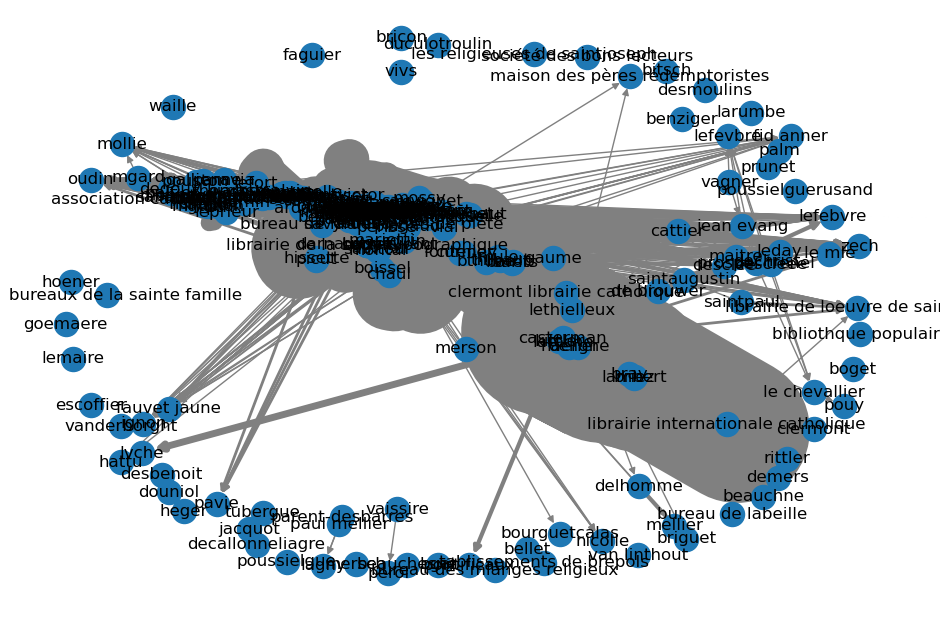

In [27]:
fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(G_combined)

edge_widths = [data['weight'] for _, _, data in G_combined.edges(data=True)]

nx.draw(
    G_combined, pos, with_labels=True, width=edge_widths,
    edge_color='gray', arrows=True, ax=ax
)

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_graph_updated.png')

plt.show()

In [30]:
plt.clf()
plt.close()

In [37]:
import matplotlib
print(matplotlib.get_backend())

TkAgg


In [38]:
%matplotlib inline

In [40]:
for _, _, data in G_combined.edges(data=True):
    if 'weight' not in data or data['weight'] is None:
        print("Edge missing weight:", data)

In [41]:
import networkx as nx

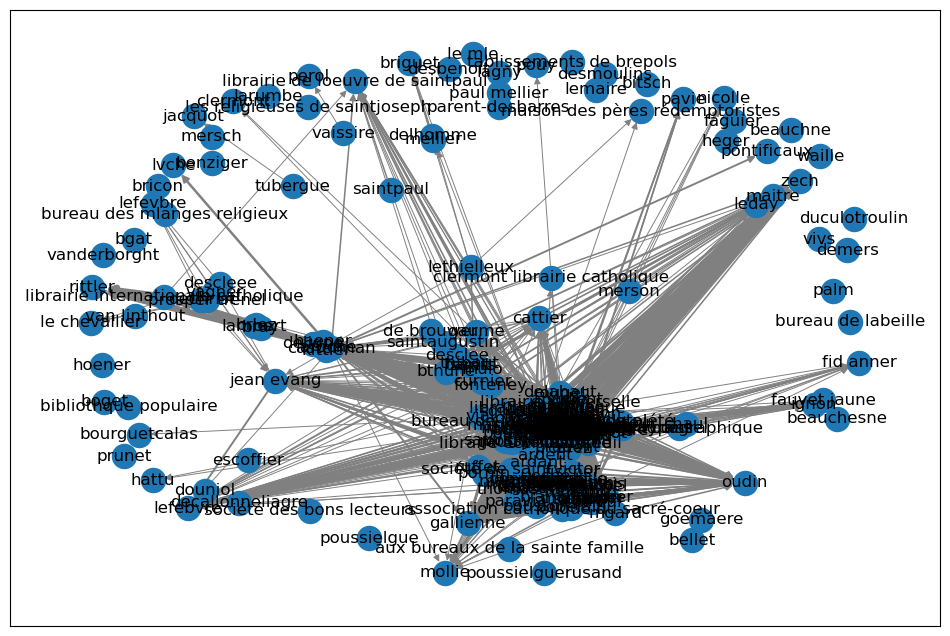

In [47]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(G_combined)
edge_widths = [np.log(data['weight'] + 1) for _, _, data in G_combined.edges(data=True)]

nx.draw_networkx(
    G_combined,
    pos,
    with_labels=True,
    width=edge_widths,
    edge_color='gray',
    arrows=True
)

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_graph_updated1.png')

plt.show()

In [53]:
plt.close()

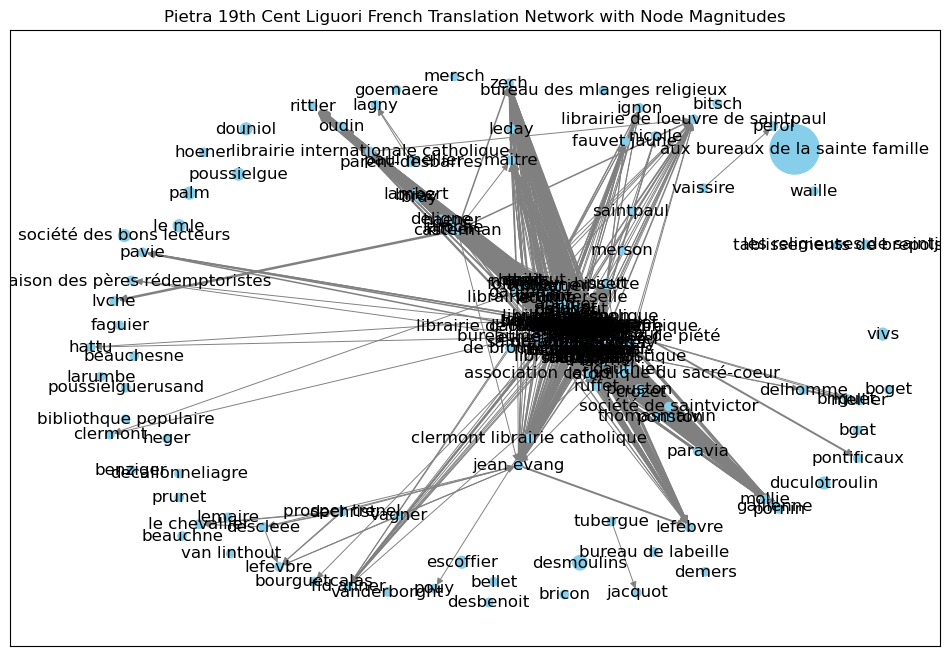

In [54]:
fig, ax = plt.subplots(figsize=(12, 8))

node_sizes = [G_combined.nodes[node].get('magnitude', 1) for node in G_combined.nodes()]

# Scale node sizes for better visualization (adjust scaling factor as needed)
node_sizes = [size * 36 for size in node_sizes]

pos = nx.spring_layout(G_combined)

edge_widths = [np.log(data['weight'] + 1) for _, _, data in G_combined.edges(data=True)]


nx.draw_networkx(G_combined, pos, node_size=node_sizes, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network with Node Magnitudes")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_w_Node_Magnitudes.png')

plt.show()

In [55]:

main_component = max(nx.weakly_connected_components(G_combined), key=len)
G_main = G_combined.subgraph(main_component)

In [57]:

node_sizes1 = [G_main.nodes[node].get('magnitude', 1) for node in G_main.nodes()]

node_sizes1 = [size * 36 for size in node_sizes1]

In [58]:
plt.close()

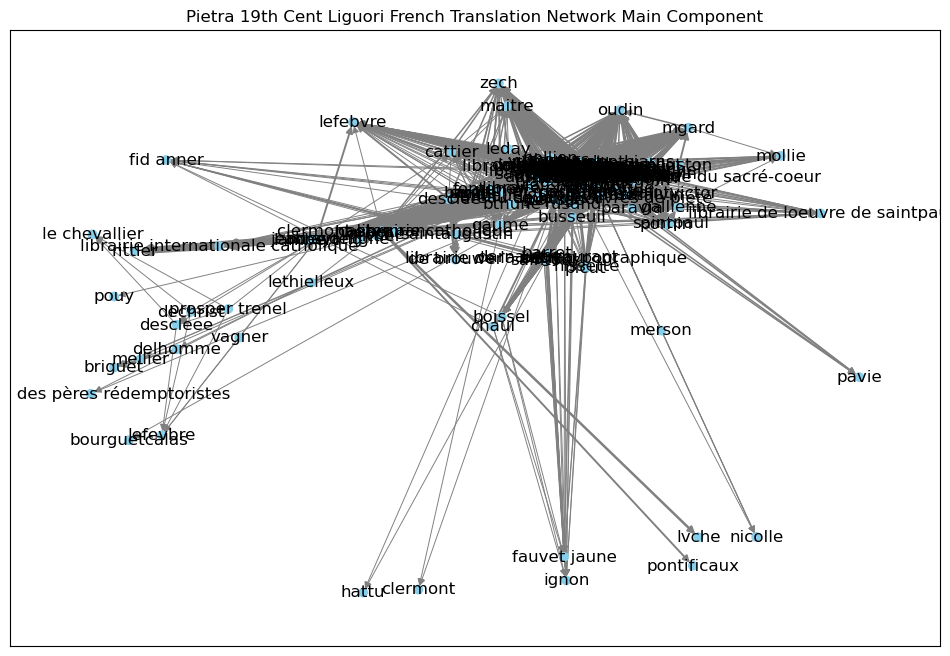

In [59]:
fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(G_main)

edge_widths1 = [np.log(data['weight'] + 1) for _, _, data in G_main.edges(data=True)]

nx.draw_networkx(G_main, pos, node_size=node_sizes1, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths1, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component.png')

plt.show()

In [60]:
plt.close()

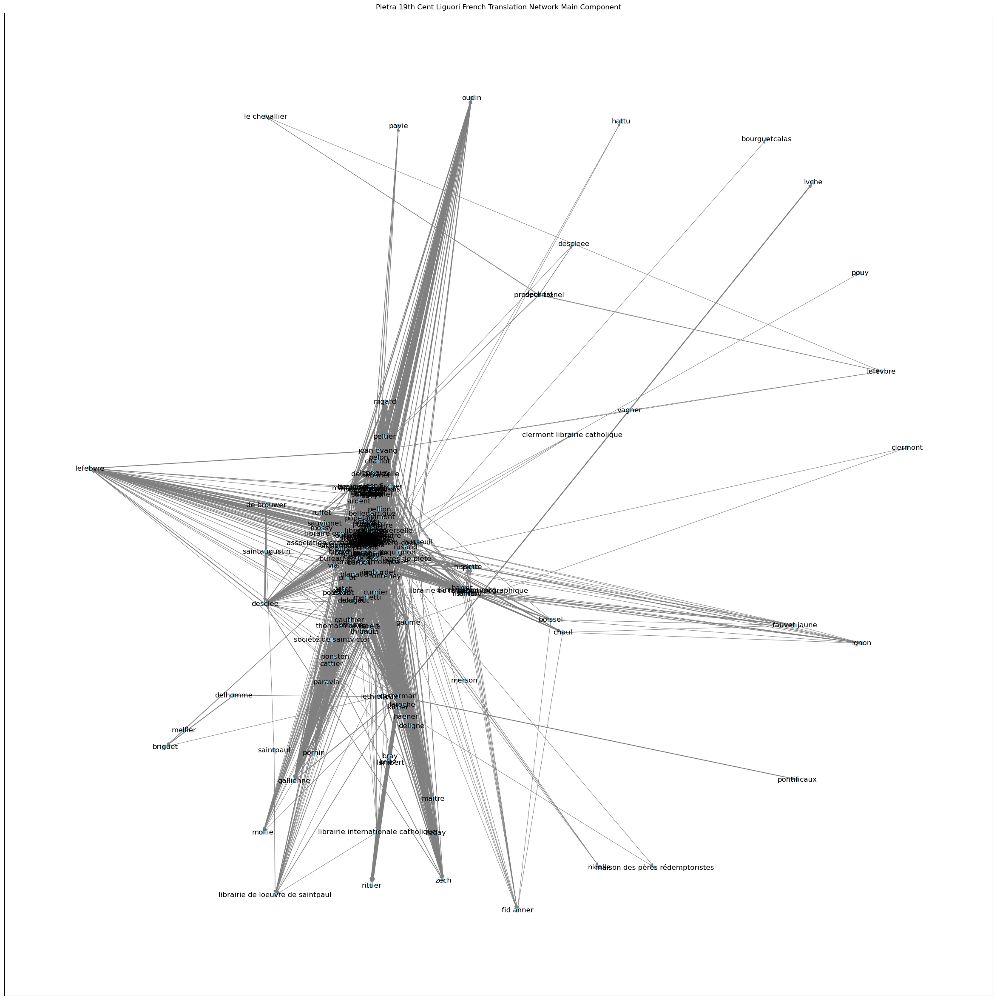

In [61]:

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G_main)

edge_widths1 = [np.log(data['weight'] + 1) for _, _, data in G_main.edges(data=True)]

nx.draw_networkx(G_main, pos, node_size=node_sizes1, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths1, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Magnified.png')

plt.show()

In [62]:
len(G_main.nodes())

189

In [69]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:75]

In [70]:
G_main_component_dense_region = G_main.subgraph(top_nodes)

In [71]:
plt.close()

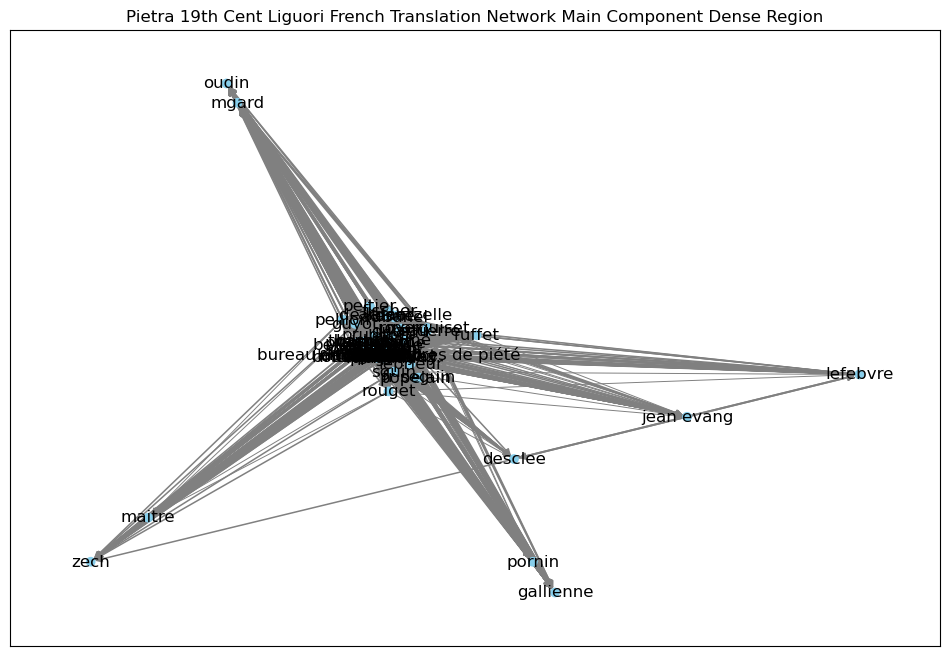

In [72]:

fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(G_main_component_dense_region)

node_sizes2 = [G_main_component_dense_region[node].get('magnitude', 1) for node in G_main_component_dense_region.nodes()]

node_sizes2 = [size * 36 for size in node_sizes2]

edge_widths2 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region, pos, node_size=node_sizes2, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths2, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom.png')

plt.show()

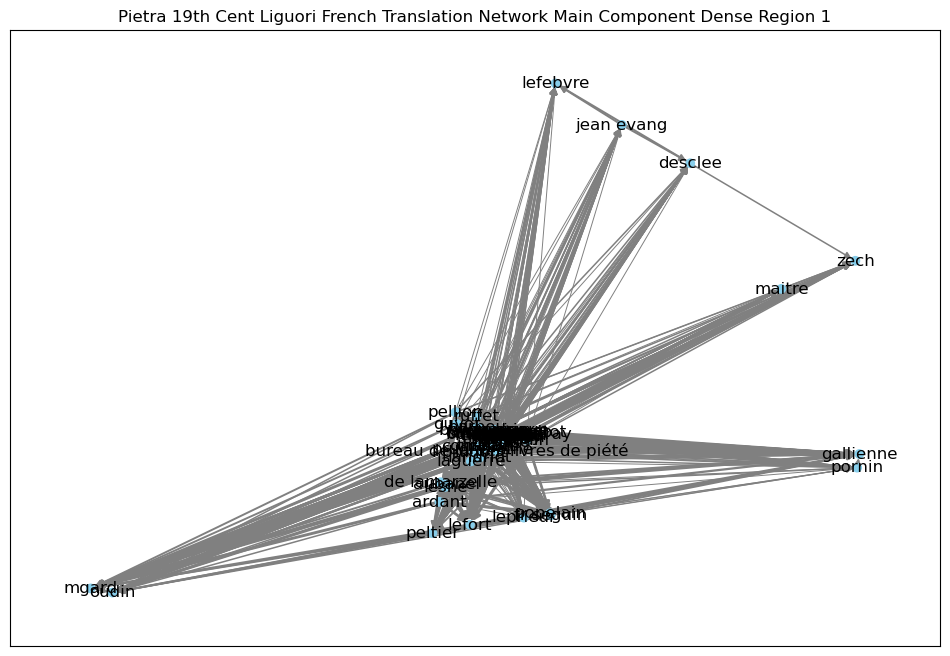

In [75]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:60]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 1")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1.png', dpi=600)

plt.show()

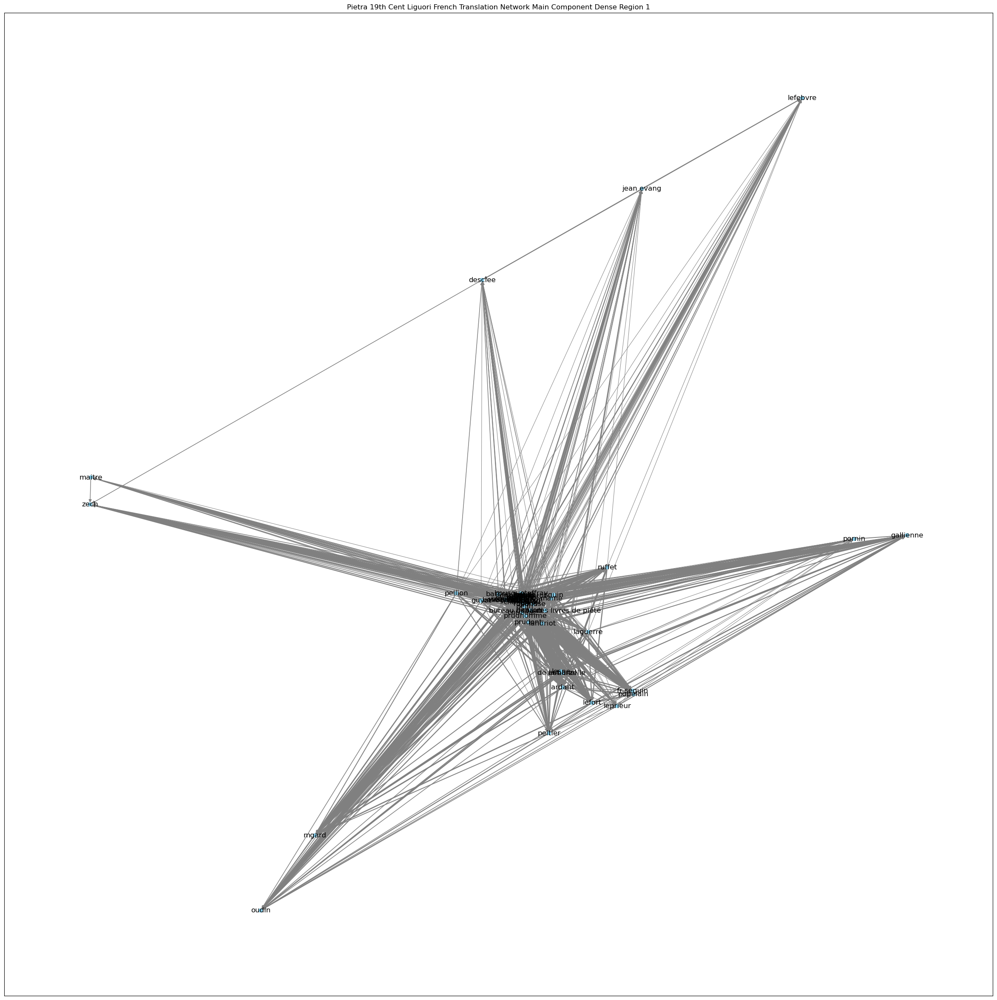

In [76]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:60]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 1")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1_Magnified.png', dpi=600)

plt.show()

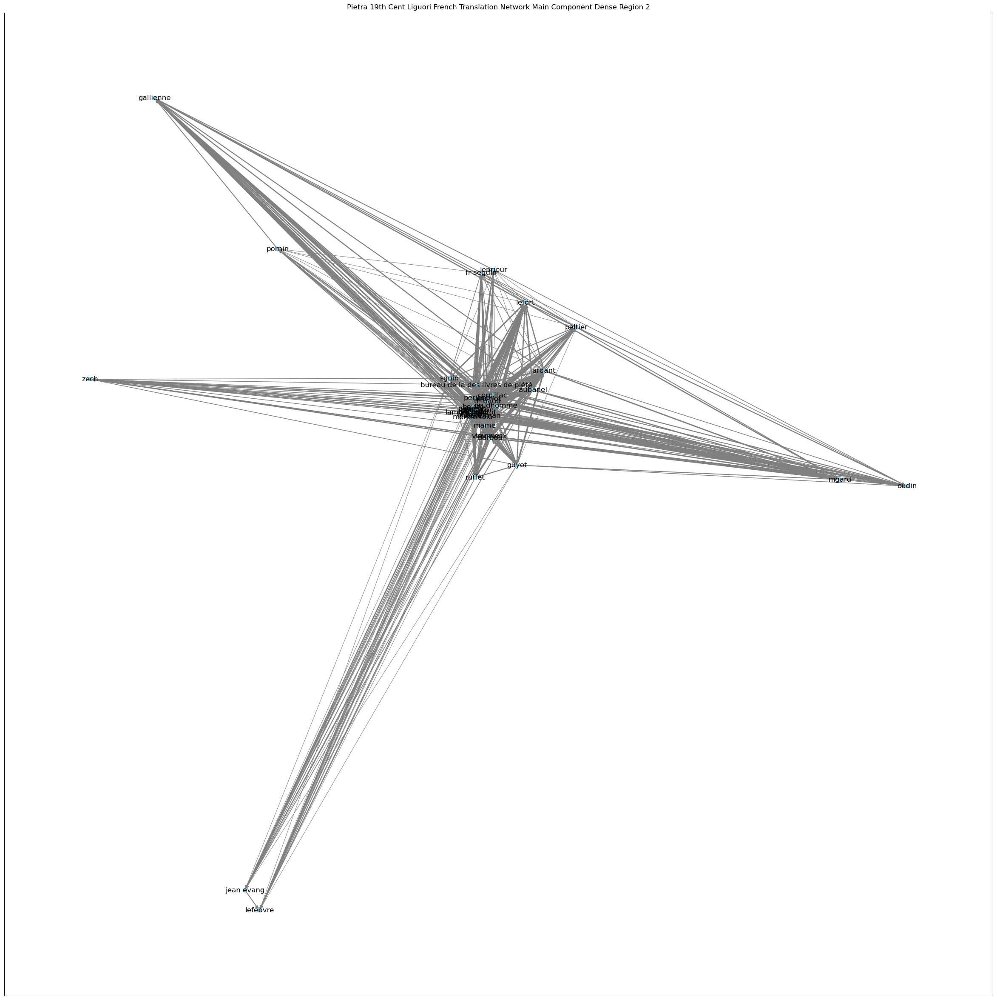

In [77]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:40]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 2")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1_Magnified_1.png')

plt.show()

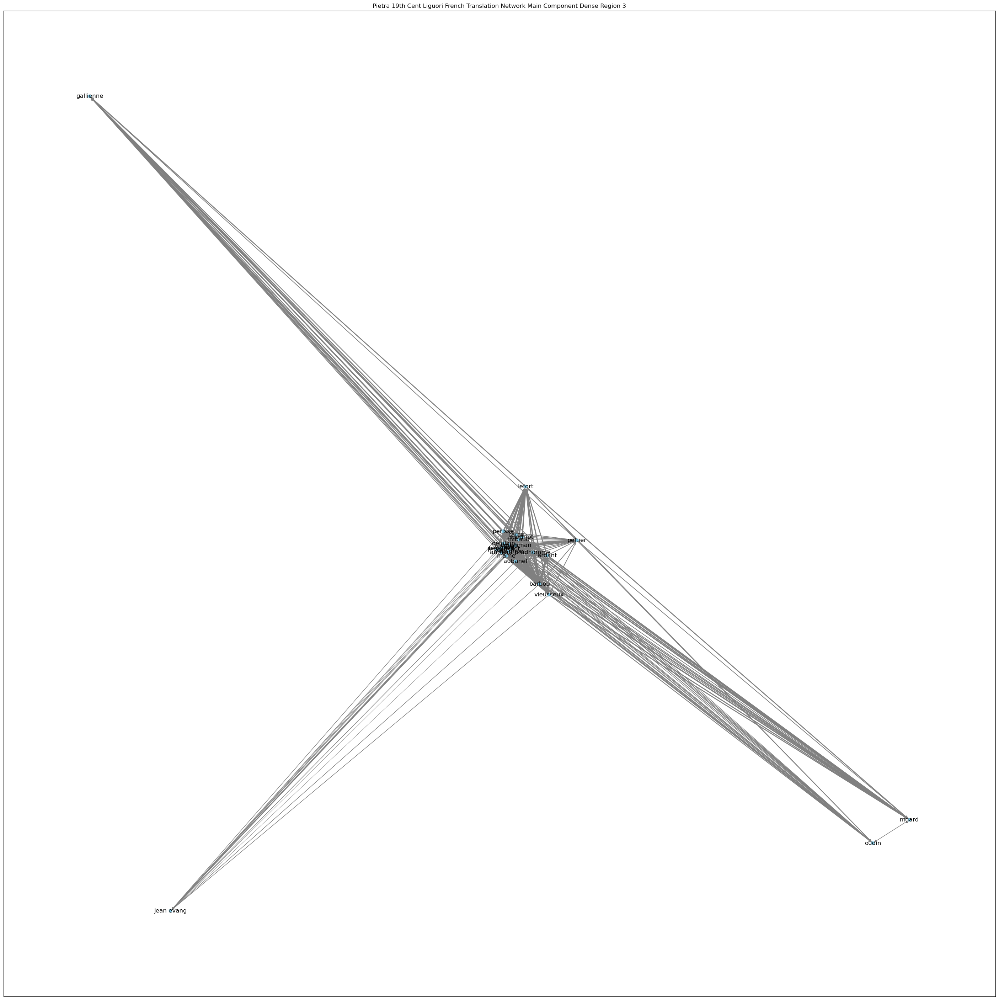

In [85]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:25]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(44, 44))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 3")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1_Magnified_3.png')

plt.show()

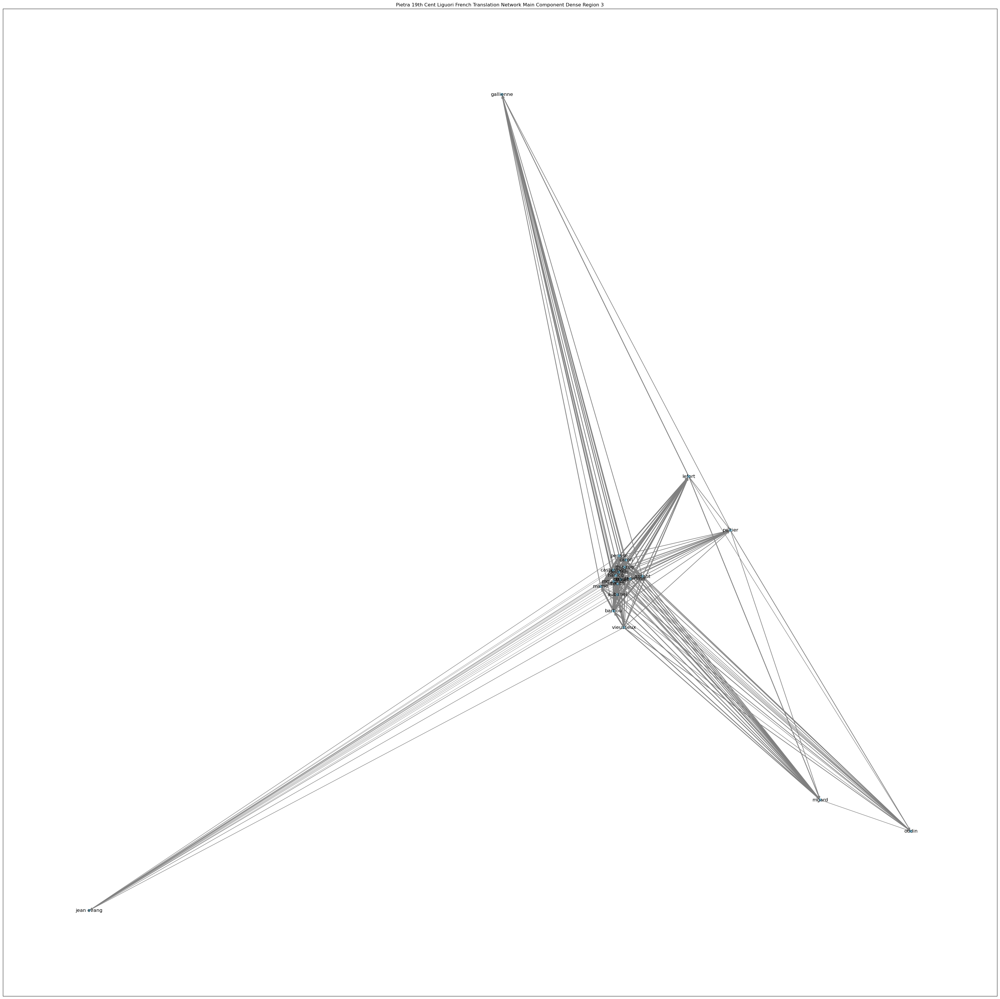

In [88]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:21]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(44, 44))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 3")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1_Magnified_4.png')

plt.show()

In [92]:
degree_centrality = nx.degree_centrality(G_main)
top_nodes1 = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:20]

G_main_component_dense_region1 = G_main.subgraph(top_nodes1)

plt.close()

fig, ax = plt.subplots(figsize=(100, 100))

pos = nx.spring_layout(G_main_component_dense_region1)

node_sizes3 = [G_main_component_dense_region1[node].get('magnitude', 1) for node in G_main_component_dense_region1.nodes()]

node_sizes3 = [size * 36 for size in node_sizes3]

edge_widths3 = [np.log(data['weight'] + 1) for _, _, data in G_main_component_dense_region1.edges(data=True)]

nx.draw_networkx(G_main_component_dense_region1, pos, node_size=node_sizes3, with_labels=True,
        alpha=1, node_color='skyblue', width=edge_widths3, edge_color='gray', arrows=True)

plt.title("Pietra 19th Cent Liguori French Translation Network Main Component Dense Region 3")

plt.savefig('Pietra_Margento_19th_Cent_Liguori_FR_Main_Component_Zoom1_Magnified_5.png')

plt.show()